<a href="https://colab.research.google.com/github/sp-au-mu-nl/PythonMedia/blob/main/chap05.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!wget https://github.com/sp-au-mu-nl/PythonMedia/raw/refs/heads/main/data/chap05.zip
!unzip chap05.zip
!rm chap05.zip
!wget https://github.com/sp-au-mu-nl/PythonMedia/raw/refs/heads/main/src/cis.py

--2025-08-21 00:26:11--  https://github.com/sp-au-mu-nl/PythonMedia/raw/refs/heads/main/data/chap05.zip
Resolving github.com (github.com)... 20.27.177.113
Connecting to github.com (github.com)|20.27.177.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/sp-au-mu-nl/PythonMedia/refs/heads/main/data/chap05.zip [following]
--2025-08-21 00:26:12--  https://raw.githubusercontent.com/sp-au-mu-nl/PythonMedia/refs/heads/main/data/chap05.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 194681 (190K) [application/zip]
Saving to: ‘chap05.zip’

chap05.zip          100%[===================>] 190.12K  1.21MB/s    in 0.2s    

2025-08-21 00:26:13 (1.21 MB/s) - ‘chap05.zip’ saved [194681/194681]

Archive: 

In [2]:
import numpy as np
import numpy.matlib
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import cv2
import librosa
import IPython
import plotly
import plotly.graph_objects as go
import cis

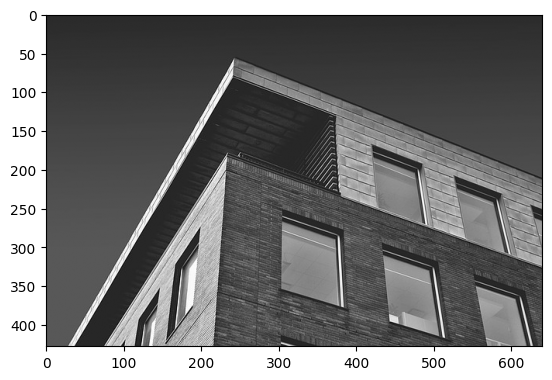

In [3]:
G=cv2.imread('building-1081868_640.jpg',0)
plt.imshow(G,cmap='gray')

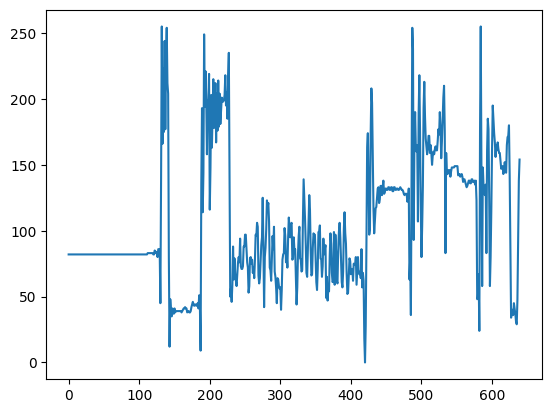

In [4]:
plt.plot(G[250,:])

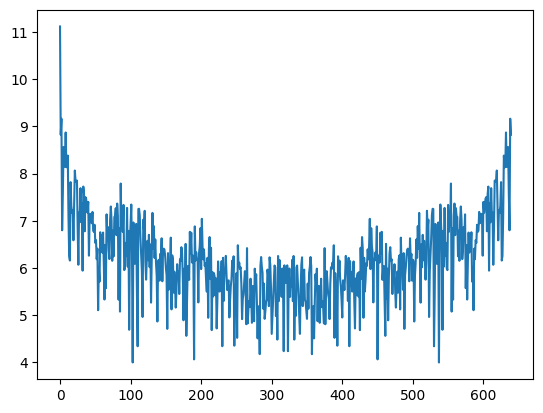

In [5]:
plt.plot(np.log(np.abs(np.fft.fft(G[250,:]))))

<StemContainer object of 3 artists>

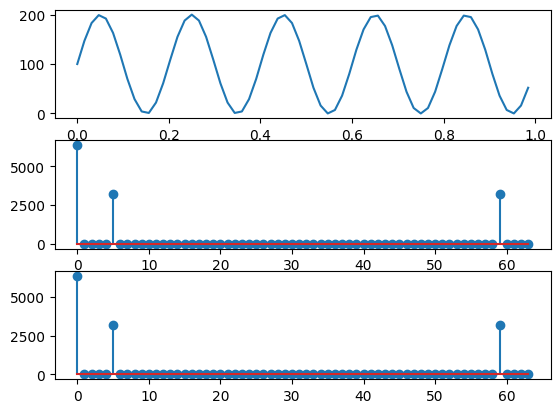

In [6]:
h,w=64,64
x=np.array([np.arange(0,1,1/h)]).T
G=np.matlib.repmat(np.uint8(100*(np.sin(2*np.pi*5*x)+1)),1,w)
plt.subplot(311); plt.plot(x,G[:,0])
plt.subplot(312); plt.stem(np.abs(np.fft.fft(G[:,0])))
S=np.fft.fft(G,axis=0)
plt.subplot(313); plt.stem(np.abs(S[:,0]))

In [7]:
S2=np.fft.fft(S,axis=1)
cis.stem3(np.abs(S2))

In [8]:
Z2=np.fft.fft2(G)
cis.stem3(np.abs(Z2))

In [9]:
cis.stem3(np.abs(np.fft.fftshift(Z2)))

<StemContainer object of 3 artists>

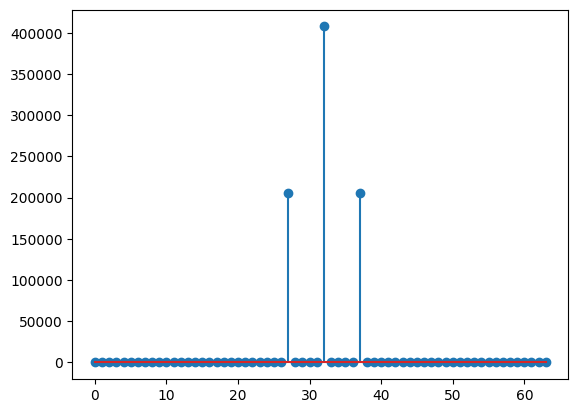

In [10]:
Z2shift=np.fft.fftshift(Z2)
plt.stem(np.abs(Z2shift[:,32]))

In [11]:
fs=8000
t=np.arange(0,1,1/fs)
y=np.sin(2*np.pi*440*t)+np.sin(2*np.pi*660*t)
fftlen=256
noverlap=128
S=librosa.stft(y,n_fft=fftlen,hop_length=fftlen-noverlap,
               window=np.hanning(fftlen))
cutoff=500
cind=int(cutoff/(fs/fftlen))
F=np.ones((S.shape[0],1))
F[cind:-cind]=0
S=S*F
ry=librosa.istft(S,hop_length=fftlen-noverlap,
                 window=np.hanning(fftlen))
IPython.display.Audio(ry,rate=fs)

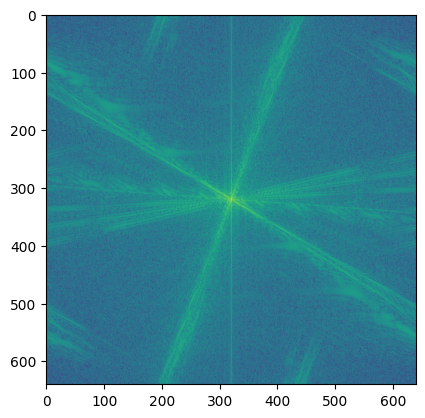

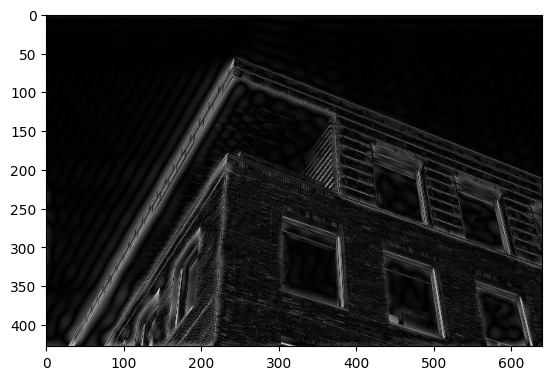

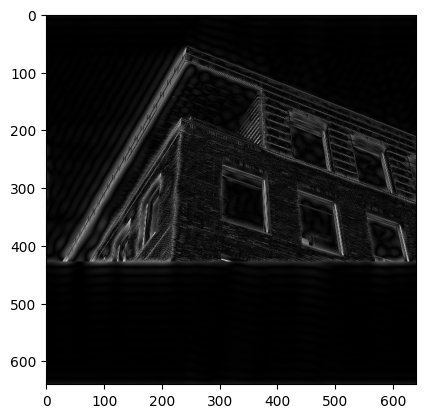

In [12]:
G=cv2.imread('building-1081868_640.jpg',0)
h,w=G.shape
fftsize=max(G.shape)
F=np.ones((fftsize,fftsize))
wlen=20
ctr=int(fftsize/2)
p1=ctr-wlen
p2=ctr+wlen
F[p1:p2,p1:p2]=0
Z=np.fft.fftshift(np.fft.fft2(G,F.shape))
plt.imshow(np.log(np.abs(Z)))
fG=np.uint8(np.abs(np.fft.ifft2(np.fft.fftshift(Z*F))))
plt.figure(); plt.imshow(fG[:h,:w],cmap='gray')
plt.figure(); plt.imshow(fG,cmap='gray')

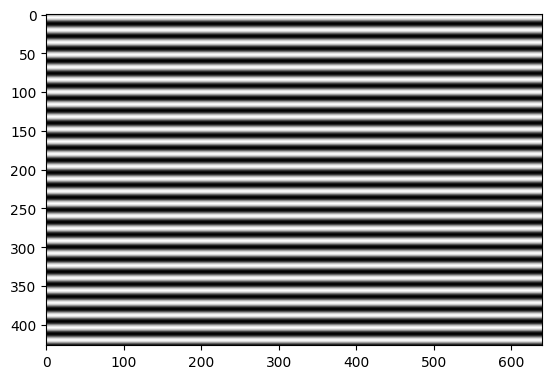

In [13]:
G=cv2.imread('cyclist-394274_640.jpg',0)
h,w=G.shape
x=np.array([np.arange(0,1,1/h)]).T
period=16
f=h/period
a=16
hp=np.matlib.repmat(np.uint8(a*(np.sin(2*np.pi*f*x)+1)),1,w)
fftsize=max(G.shape)
plt.imshow(np.uint8(hp)+np.mean(G),cmap='gray')

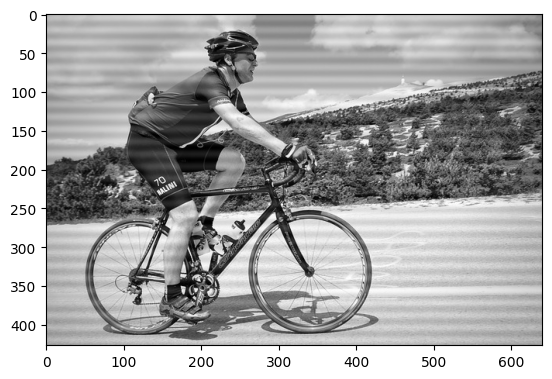

In [14]:
x1=np.uint8((np.float16(G)+np.float16(hp))/
            (float(np.max(G))+float(np.max(hp)))*255)
plt.imshow(x1,cmap='gray')

In [15]:
z=np.fft.fftshift(np.fft.fft2(x1,(fftsize,fftsize)))
cis.mesh(np.log(np.abs(z)))

/tmp/ipython-input-3427248509.py:4: RuntimeWarning:

divide by zero encountered in log



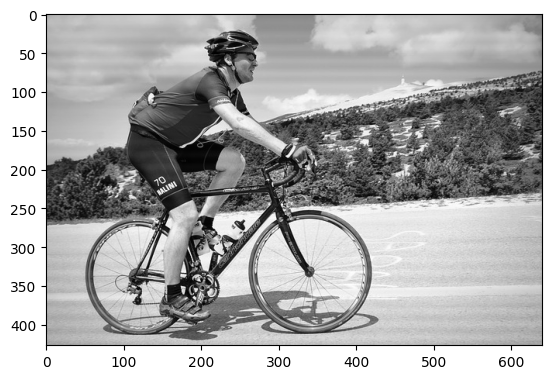

In [16]:
A=np.ones((fftsize,fftsize))
A[358:363,320]=0
A[278:283,320]=0
cis.mesh(np.log(np.abs(z*A)))
G2=np.uint8(np.abs(np.fft.ifft2(np.fft.fftshift(z*A))))
plt.figure(); plt.imshow(G2[:h,:w],cmap='gray')

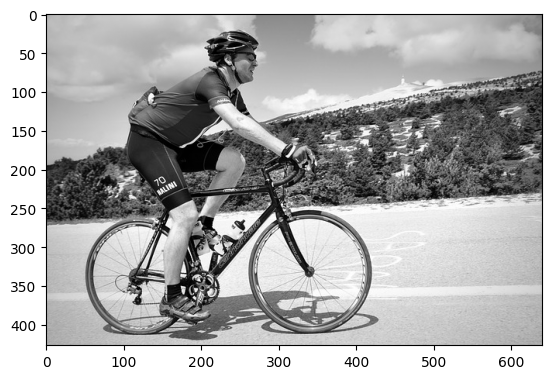

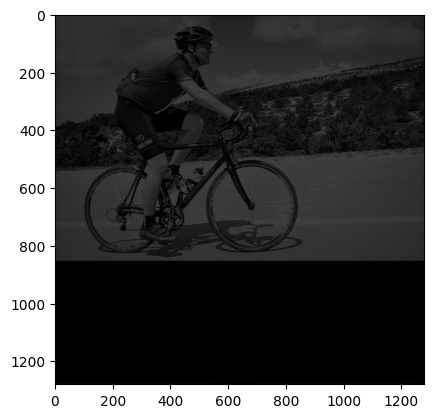

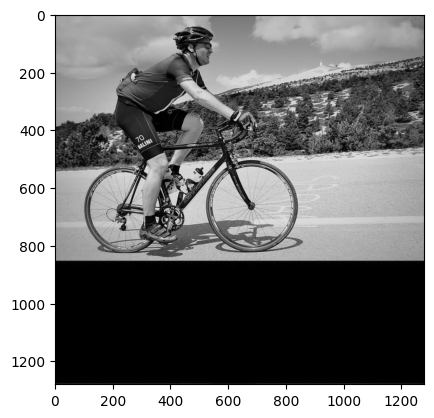

In [17]:
# G=cv2.imread('cyclist-394274_640.jpg',0)
fftsize=max(G.shape)
z=np.fft.fftshift(np.fft.fft2(G,(fftsize,fftsize)))
targetsize=fftsize*2
A=np.zeros((targetsize,targetsize),dtype=complex)
ctr=targetsize/2
c1=np.int16(ctr-fftsize/2)
c2=np.int16(ctr+fftsize/2)
A[c1:c2,c1:c2]=z
fG=np.fft.ifft2(np.fft.fftshift(A))
plt.imshow(G,cmap='gray',vmin=0,vmax=255)
plt.figure()
plt.imshow(np.uint8(np.abs(fG)),cmap='gray',vmin=0,vmax=255)
plt.figure()
plt.imshow(np.uint8(np.clip(np.abs(fG)*3.5,0,255)),cmap='gray',
           vmin=0,vmax=255)

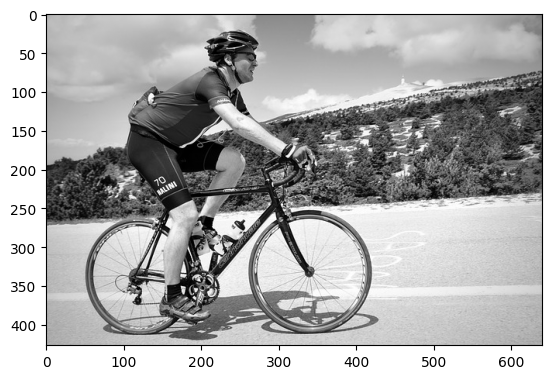

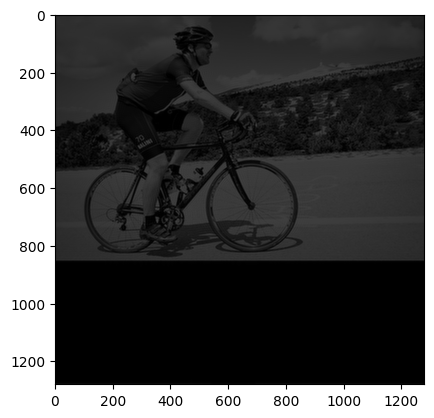

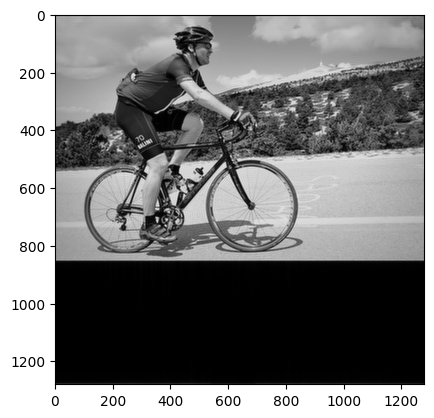

In [18]:
G=cv2.imread('cyclist-394274_640.jpg',0)
fftsize=max(G.shape)
z=np.fft.fftshift(np.fft.fft2(G,(fftsize,fftsize)))
targetsize=fftsize*2
A=np.zeros((targetsize,targetsize),dtype=complex)
ctr=targetsize/2
ctr2=fftsize/2
p1=np.int16(ctr-fftsize/4)
p2=np.int16(ctr+fftsize/4)
p3=np.int16(ctr2-fftsize/4)
p4=np.int16(ctr2+fftsize/4)
A[p1:p2,p1:p2]=z[p3:p4,p3:p4]
fG=np.fft.ifft2(np.fft.fftshift(A))
plt.imshow(G,cmap='gray',vmin=0,vmax=255)
plt.figure()
plt.imshow(np.uint8(np.abs(fG)),cmap='gray',vmin=0,vmax=255)
plt.figure()
plt.imshow(np.uint8(np.clip(np.abs(fG)*3.5,0,255)),cmap='gray',
           vmin=0,vmax=255)